<a href="https://colab.research.google.com/github/joyjitroy/Machine_Learning/blob/Machine_Learning/Computer_Vision_Plant_Seedlings_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Computer Vision: Plant Seedlings Classification

## Problem Statement

### Context

In recent times, the field of agriculture has been in urgent need of modernizing, since the amount of manual work people need to put in to check if plants are growing correctly is still highly extensive. Despite several advances in agricultural technology, people working in the agricultural industry still need to have the ability to sort and recognize different plants and weeds, which takes a lot of time and effort in the long term. The potential is ripe for this trillion-dollar industry to be greatly impacted by technological innovations that cut down on the requirement for manual labor, and this is where Artificial Intelligence can actually benefit the workers in this field, as **the time and energy required to identify plant seedlings will be greatly shortened by the use of AI and Deep Learning.** The ability to do so far more efficiently and even more effectively than experienced manual labor, could lead to better crop yields, the freeing up of human inolvement for higher-order agricultural decision making, and in the long term will result in more sustainable environmental practices in agriculture as well.


### Objective

The aim of this project is to Build a Convolutional Neural Netowrk to classify plant seedlings into their respective categories.

### Data Dictionary

The Aarhus University Signal Processing group, in collaboration with the University of Southern Denmark, has recently released a dataset containing **images of unique plants belonging to 12 different species.**

- The dataset can be download from Olympus.
- The data file names are:
    - images.npy
    - Labels.csv
- Due to the large volume of data, the images were converted to the images.npy file and the labels are also put into Labels.csv, so that you can work on the data/project seamlessly without having to worry about the high data volume.

- The goal of the project is to create a classifier capable of determining a plant's species from an image.

**List of Species**

- Black-grass
- Charlock
- Cleavers
- Common Chickweed
- Common Wheat
- Fat Hen
- Loose Silky-bent
- Maize
- Scentless Mayweed
- Shepherds Purse
- Small-flowered Cranesbill
- Sugar beet

### **Note: Please use GPU runtime on Google Colab to execute the code faster.**

## Importing necessary libraries

In [ ]:
# Installing the libraries with the specified version
# uncomment and run the following line if Google Colab is being used
#!pip install tensorflow==2.15.0 scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 opencv-python==4.8.0.76 -q --user

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
#!pip install tensorflow==2.13.0 scikit-learn==1.2.2 seaborn==0.11.1 matplotlib==3.3.4 numpy==1.24.3 pandas==1.5.2 opencv-python==4.8.0.76 -q --user

In [ ]:
# Import Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Import Libraries for data visualization
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter  # Import FuncFormatter
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# Import Library to provide informative messages to users without interrupting the flow of the program
# Warnings are typically used to alert users of potential problems,
# such as deprecated features or unexpected runtime conditions
import warnings
warnings.filterwarnings("ignore")

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

## Loading the dataset

In [ ]:
# Mount google drive to Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Read the Data from excel into a dataset
folder = '/content/drive/MyDrive/AI_ML/Projects/Computer Vision/' # Path of the data files
labels_file = 'Labels.csv'                                        # Name of the label file
image_file = 'images.npy'                                         # Name of the image file

labels_ = pd.read_csv(folder + labels_file)                       # Reading the label file
images_ = np.load(folder + image_file)                            # Loading the image file

In [ ]:
# copying data to another variable to avoid any changes to original data
labels = labels_.copy()
images = images_.copy()

## Data Overview

### Understand the shape of the dataset

In [ ]:
# Understand the shape of the dataset
print("There are", labels.shape[0], "labels in the label dataset.")
print("There are", images.shape[0], "images in the image dataset and the shape of the images are", images.shape[1:])

There are 4750 labels in the label dataset.
There are 4750 images in the image dataset and the shape of the images are (128, 128, 3)


## Exploratory Data Analysis

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you understand the data better.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

1. How are these different category plant images different from each other?
2. Is the dataset provided an imbalance? (Check with using bar plots)

### Define Useful Functions for Improved Graphical Representations

#### Functions to Render a labeled Barplot

In [ ]:
# function to create labeled barplots
def labeled_barplot(data,             # dataframe
                    feature,          # dataframe column name
                    hue = None,       # second dataframe column name
                    mapping = {},     # if column represent binary value then map to the actual value
                    perc = False,     # whether to display percentages instead of count (default is False)
                    n = None,         # displays the top n category levels (default is None, i.e., display all levels)
                    Title = None,
                    xlabel = None,
                    palette = "Paired",
                    fontsize = 12, degree = 0):

    # Handling NaN values
    data[feature] = data[feature].fillna("Missing")

    # Apply the mapping to the feature column if a mapping dictionary is provided
    if mapping:
        data[feature] = data[feature].map(mapping)

    # Get the order of the categories by count
    order = data[feature].value_counts().index[:n]

    hue_count = 0 if hue == None else data[hue].nunique() # number of unique values in the hue column
    count = data[feature].nunique() + hue_count           # number of unique values
    total = len(data[feature])                            # length of the column

    # Set the Plot size
    plt.figure(figsize = (count + 1, 5)) if n is None else plt.figure(figsize = (n + 1, 5))

    # Generate the Plot
    ax = sns.countplot(data = data, x = feature, hue = hue, palette = palette,
        order = order.sort_values(),
    )
    # For each bar: Place a label
    ax = annotate_the_labels(ax, total, perc = perc)

    # Render the barplot
    plot_styling(data, feature, mapping,
                 Title, "Barplot of ",
                 xlabel, degree = degree,
                 )

    sns.despine(left=True)    # Hide the plot border
    plt.show()                # show the plot

In [ ]:
def annotate_the_labels(ax, col, fontsize = 12, perc = True):
  for p in ax.patches:
    # Set the Label
    label = "{:.1f}%".format(100 * p.get_height() / col) if perc else p.get_height()

    # Get the x and y position of the label
    x = p.get_x() + p.get_width() / 2   # width of the plot
    y = p.get_height()                  # height of the plot

    # Annotate the Labels
    ax.annotate(label, (x, y), ha = "center", va = "center",
      size = fontsize, xytext = (0, 5), textcoords="offset points",
      )  # annotate the percentage

  return ax

In [ ]:
def plot_styling (  data,
                    feature,
                    mapping = {},
                    Title = None,
                    Title_prefix = "",
                    xlabel = None,
                    fontsize = 12, degree = 0,
                    ):
    # If Title is Not Specified, Set the Title of the Plot
    Title = (Title_prefix + " " + (feature.replace("_", " "))) if Title is None else Title

    # Add the Title to the Plot
    plt.title(Title, fontsize = fontsize, y=1.02)

    # if x Axis label is not specified, then
    # Set the x axis label by replacing Underscores in the Column Name with Spaces
    plt.xlabel(((feature.replace("_", " ")) if xlabel is None else xlabel),
               fontsize = fontsize)

    # map the xticks label
    labels = [mapping.get(x, x) for x in np.sort(data[feature].unique())]

    # Set the xticks labels
    plt.xticks(tuple(range(0, len(labels))),
               labels = labels,
               rotation = degree, fontsize = fontsize # Rotate the x-Axis Label and set the front side
               )

#### Functions to Plot Images

In [ ]:
# Function to plot an Image
def plot_image(fig, image, position, title = None, xlabel = None, ylabel = None):
    ax = fig.add_subplot(*position)          # Add a subplot to the figure
    ax.imshow(image)                         # Display the image
    ax.set_title(title)                      # Set the title to the category and index
    ax.set_xlabel(xlabel)                    # Set the x-axis label
    ax.set_ylabel(ylabel)                    # Set the y-axis label

In [ ]:
# Plot multiple images in subplot
def plot_images(images, labels, samples_per_class = 1, img_size = (64, 64), title = None):
    categories = np.unique(labels)                        # Get unique categories (classes)

    fig_width = samples_per_class * img_size[1] / 100     # Convert pixel size to inches (approximation)
    fig_height = len(categories) * img_size[0] / 100      # Convert pixel size to inches (approximation)
    fig = plt.figure(figsize = (fig_width, fig_height))   # Create a figure with the specified size

    # Create a dictionary mapping each category to its indices in the images array
    class_indices = {category: np.where(labels == category)[0] for category in categories}

    for i, category in enumerate(categories):              # Loop through each category
        indices = class_indices[category]                  # Get the indices of images for the current category

        # Randomly sample a specified number of indices for the current category
        sample_indices = np.random.choice(indices, samples_per_class, replace = False)

        for j, index in enumerate(sample_indices):          # Loop through the sampled indices
            position = len(categories), samples_per_class, i * samples_per_class + j + 1  # Calculate the subplot position
            plot_image(fig, images[index, :], position, title = category)                         # plot individual Image

    plt.suptitle(title, y = 1,fontsize = 14)                # Set the title of the plot
    plt.tight_layout()                                      # Adjust the spacing between subplots
    plt.show()                                              # Show the figure

#### Function to Render a Histogram

In [ ]:
# Plots a histogram using seaborn's histplot function.
def plot_histogram(data, ax, title, xlabel=None, ylabel=None, fontsize=12, bins=24, color='blue', palette="winter"):
    sns.histplot(data, ax=ax, bins=bins, color=color, palette=palette)  # Plot the histogram
    ax.set_title(title, fontsize=fontsize)                              # Set the title
    ax.set_xlabel(xlabel, fontsize=fontsize)                            # Set the x-axis label
    ax.set_ylabel(ylabel, fontsize=fontsize)                            # Set the y-axis label

### Plotting random images from each of the class

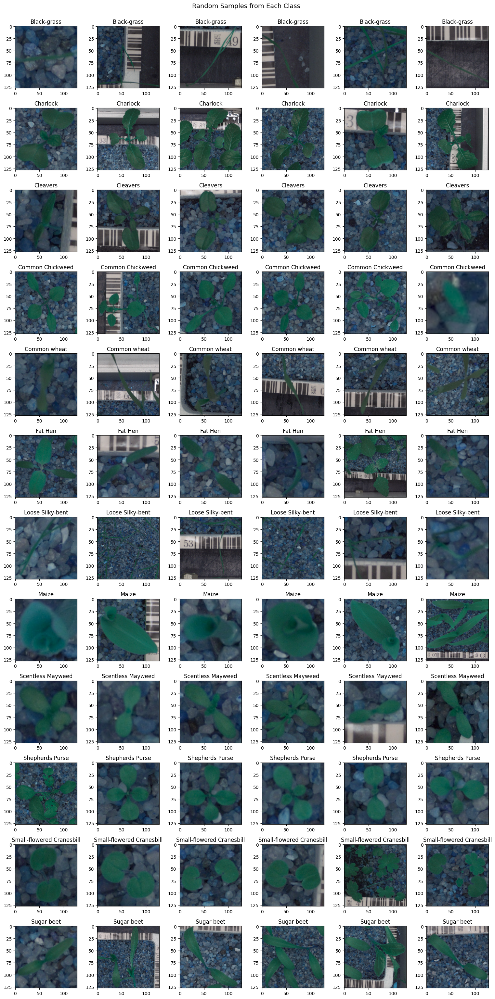

In [ ]:
# Plot random images from each of the classes and print their corresponding labels.
# Assuming images is a numpy array of shape (num_samples, height, width, channels)

plot_images(images, labels, samples_per_class = 6, img_size = (256, 256),
            title = "Random Samples from Each Class",
            )

### Checking the distribution of the Target Variable

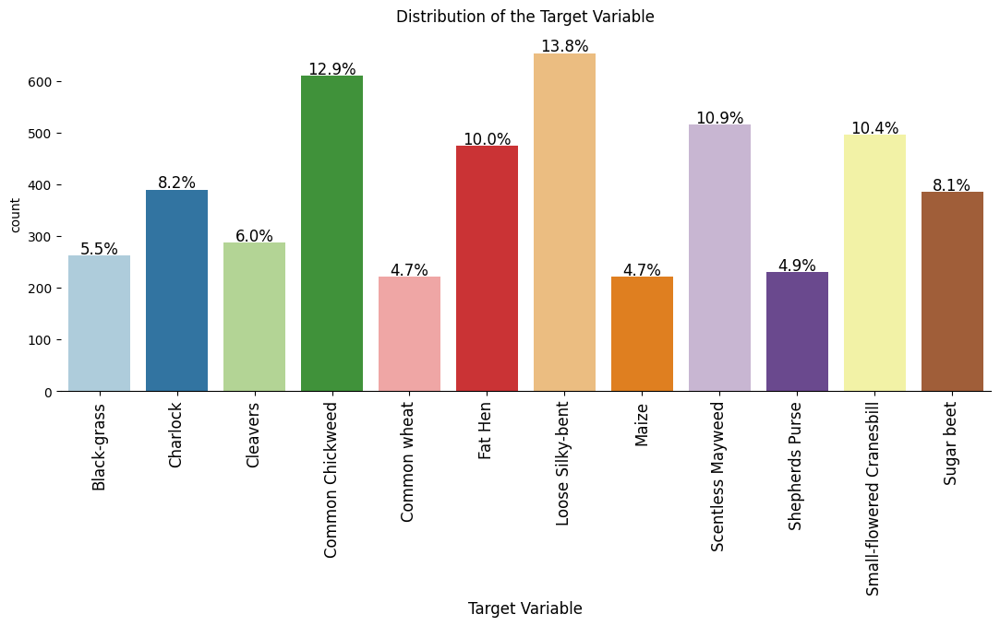

In [ ]:
# Count Plot for each category
labeled_barplot(labels,'Label', perc = True,
                Title = "Distribution of the Target Variable",
                xlabel = "Target Variable",
                degree = 90,
                )

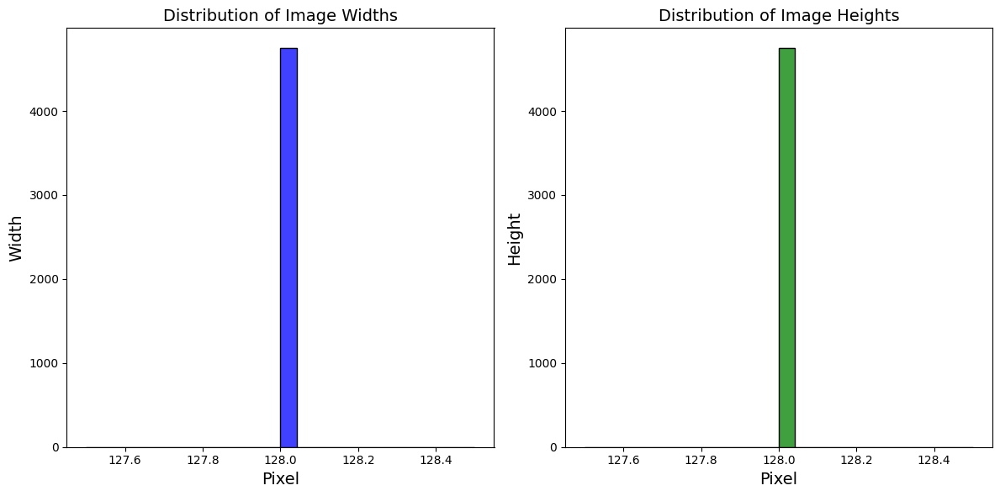

In [ ]:
# Extract image dimensions
# Check the Distribution of Width and Height of all images
img_widths, img_heights = [], []

for img in images:
    height, weidth, _ = img.shape
    img_widths.append(weidth)
    img_heights.append(height)

# Plot the histogram
fig, ax = plt.subplots(1, 2, figsize=(12, 6))  # Create a figure with two subplots

plot_histogram(img_widths, ax[0], "Distribution of Image Widths", "Pixel", "Width", fontsize = 14, color = 'blue')
plot_histogram(img_heights, ax[1], "Distribution of Image Heights", "Pixel", "Height", fontsize = 14, color = 'green')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()          # Show the plot

In [ ]:
# Function to check if an image is grayscale
def is_grayscale(image):
  # Check if the red and green channels are equal, and the green and blue channels are equal
  return np.all(img[:, :, 0] == img[:, :, 1]) and np.all(img[:, :, 1] == img[:, :, 2])

In [ ]:
gray_images = [img for img in images if is_grayscale(img)]  # Filter images using the is_grayscale function
print(f"Total grayscale images: {len(gray_images)}")        # Print the result

Total grayscale images: 0


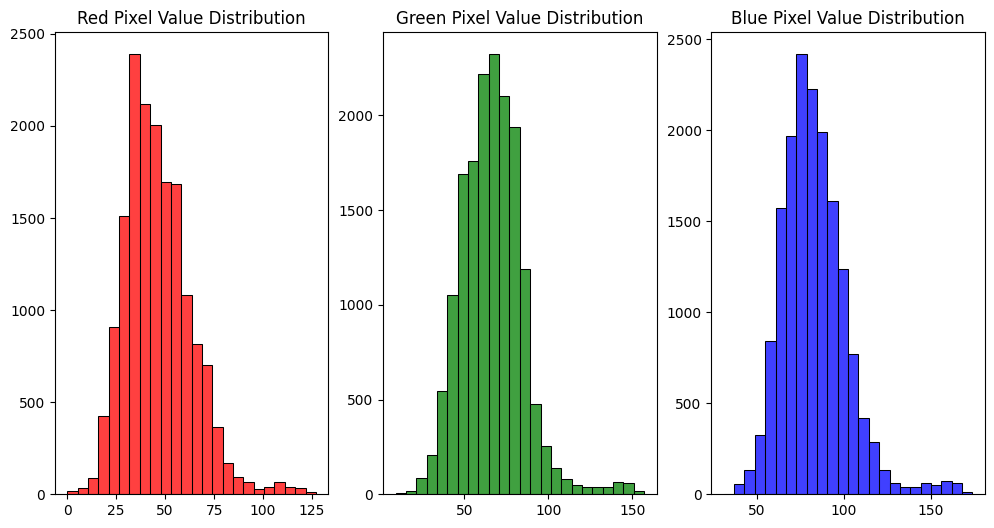

In [ ]:
# Choose a random image and plot pixel value distribution
random_img = images[np.random.randint(0, len(images))]

colors = ['Red', 'Green', 'Blue']                       # List of colors
fig, ax = plt.subplots(1, 3, figsize=(12, 6))           # Create a figure with three subplots

random_img = images[np.random.randint(0, len(images))]  # Choose a random image

# Plot pixel value distribution for each color channel
for i, color in enumerate(colors):
  plot_histogram(random_img[:, :, i].ravel(), ax[i], title = f"{color} Pixel Value Distribution", fontsize = 12, color = color)

**Observations**

- The training dataset is imbalanced. Certain plant classes, including Common Wheat, Maize, and Shepherd's Purse, have a relatively low frequency of occurrence.
- All images in the dataset share a consistent resolution, with no deviations in width or height.
- The distribution is uniform and consistent, indicating that no additional pre-processing steps are required to normalize or balance the color channels.
- All Images are color Image.

## Data Pre-Processing

### Convert the BGR images to RGB images.

In [ ]:
import cv2    # Import necessery Class

# Converting the images from BGR to RGB using cvtColor function of OpenCV
for i in range(len(images)):
  images[i] = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)

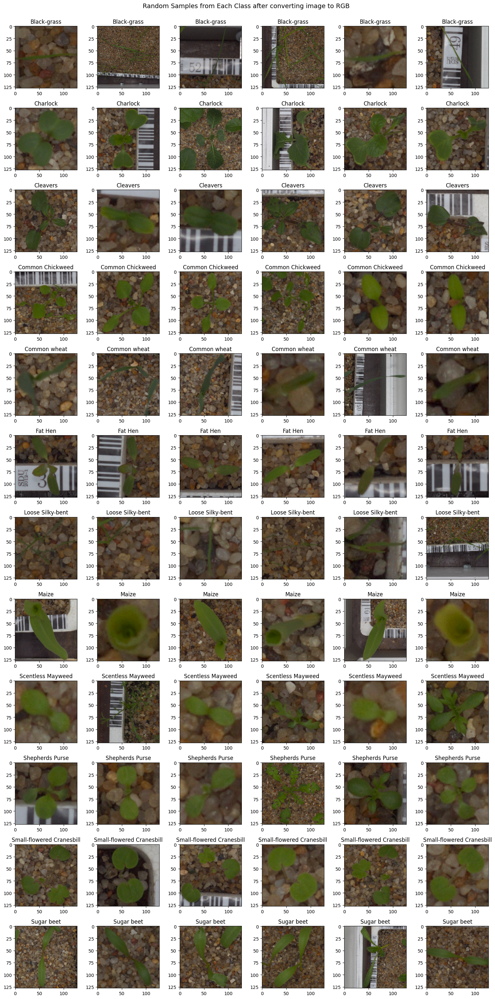

In [ ]:
# Plot random images from each of the classes and print their corresponding labels.
# Assuming images is a numpy array of shape (num_samples, height, width, channels)

plot_images(images, labels, samples_per_class = 6, img_size = (256, 256),
            title = "Random Samples from Each Class after converting image to RGB",
            )

### Resize the images

As the size of the images is large, it may be computationally expensive to train on these larger images; therefore, it is preferable to reduce the image size from 128 to 64.

In [ ]:
# Downscale the images
image_downscale = []      # List to store the downscaled images
height, weidth = 64, 64   # Set the height and width of the downscaled images

for img in images:        # Loop through each image in the list
                          # Resize the image using the INTER_LINEAR interpolation method
  img_downscale = cv2.resize(img, (height, weidth), interpolation=cv2.INTER_LINEAR)
                          # Append the downscaled image to the list
  image_downscale.append(img_downscale)

**Compare image before and after resizing**

(1, 2, 1)
(1, 2, 2)


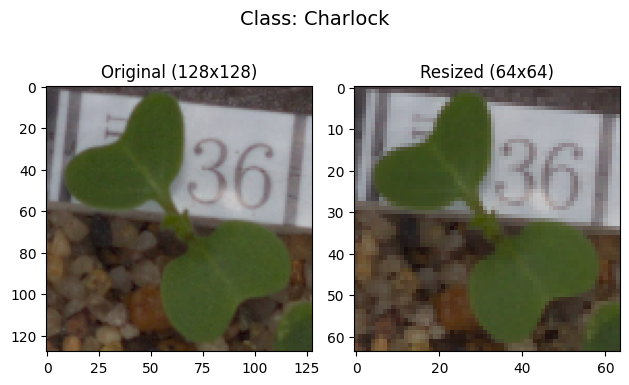

In [ ]:
import random         # import necessery Library

random_index = random.randint(0, len(images) - 1)               # Select a random image index
titles = ["Original", "Resized"]                                # Set the titles for the subplots
image = [images[random_index], image_downscale[random_index]]   # Create a list of images to display

fig = plt.figure()                                                                      # Create a figure
plt.suptitle(f"Class: {labels.iloc[random_index,0]}", y = 0.9, fontsize = 14)           # Set the main title

# Create the plot
for i in range(len(titles)):
    position = (1, len(titles), i + 1)                          # Set the subplot position
    print(position)
    plot_image(fig, image[i], position,
               f"{titles[i]} ({image[i].shape[1]}x{image[i].shape[0]})",

               )

plt.tight_layout()                                              # Adjust the spacing between subplots
plt.show()                                                      # Display the plot

### Split the Data in Train, Test and Validation Set

- Before you proceed to build a model, you need to split the data into train, test, and validation to be able to evaluate the model that you build on the train data
- You'll have to encode categorical features and scale the pixel values.
- You will build a model using the train data and then check its performance

In [ ]:
# Import Library to tune different models
from sklearn.model_selection import train_test_split

# Function to split data into training, validation, and test sets
def split_data(X, y, test_size = 0.2, val_size  = 0.2, random_state = 1):
  # Splitting data into training, validation, and test sets
  X_temp, X_test, y_temp, y_test = train_test_split(
     X, y, test_size = test_size, random_state = random_state, stratify = y
  )

  X_train, X_val, y_train, y_val = train_test_split(
     X_temp, y_temp, test_size= val_size,  # Adjusting val_size to be a fraction of the training set
     random_state = random_state, stratify = y_temp
  )

  return X_train, X_val, X_test, y_train, y_val, y_test

In [ ]:
random_state = 42  # Set a random state for reproducibility

# Splitting data in train, validation and test sets
X_train, X_val, X_test, y_train, y_val, y_test = split_data(np.array(image_downscale), labels,
                                                            test_size = 0.1,
                                                            val_size = 0.1,
                                                            random_state = random_state
                                                            )

# Print information about the split
print("Data split into:")
print("Train set:", f"({X_train.shape[0]}, {(X_train.shape[1:])})", y_train.shape)
print("Validation set:", f"({X_val.shape[0]}, {(X_val.shape[1:])})", y_val.shape)
print("Test set:", f"({X_test.shape[0]}, {(X_test.shape[1:])})", y_test.shape)

Data split into:
Train set: (3847, (64, 64, 3)) (3847, 1)
Validation set: (428, (64, 64, 3)) (428, 1)
Test set: (475, (64, 64, 3)) (475, 1)


### Target Labels Encoding

In [ ]:
from sklearn.preprocessing import LabelBinarizer  # Import LabelBinarizer

enc = LabelBinarizer()      # Initialize Label Encoder class

# Convert labels from names to one hot vectors
y_train_encoded = enc.fit_transform(y_train)
y_val_encoded = enc.transform(y_val)
y_test_encoded = enc.transform(y_test)

# Print information after Target Lebel encoding
print("Data after Target Lebel encoding:")
print("Training Dataset Shape:", y_train_encoded.shape)
print("Validation Dataset Shape:", y_val_encoded.shape)
print("Test Dataset Shape:", y_test_encoded.shape)

Data after Target Lebel encoding:
Training Dataset Shape: (3847, 12)
Validation Dataset Shape: (428, 12)
Test Dataset Shape: (475, 12)


### Data Normalization

In [ ]:
# Normalize the image pixels of train, test and validation data
X_train_normalized = X_train.astype('float32') / 255.0
X_val_normalized = X_val.astype('float32') / 255.0
X_test_normalized = X_test.astype('float32') / 255.0

## Model Building

### Define useful functions

#### Functions to Build Model

In [ ]:
# Import Important Libraries
import tensorflow as tf
from tensorflow import keras
from keras import backend
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping

# importing different functions to build models
def create_model(models, params):
    if params["model"] in models:
        del models[params["model"]]             # Delete the existing model if it exists

    clear_session(random_index)                 # Clear the Keras session to reset the state

    model = Sequential(name = params["model"])  # Initialize the Sequential model with a specific name

    for layer in params["layers"]:
      layer_type = next(iter(layer.keys()))     # Get the first key in the dictionary

      # Dynamically get the layer class from tf.keras.layers
      layer_class = getattr(tf.keras.layers, layer_type)
      model.add(layer_class(**layer[layer_type]))  # Add the layer to the model

    # Compile the model with the specified optimizer and loss function
    model.compile(**params["compile"])

    return model                                # Return the compiled model

In [ ]:
import gc  # Import the garbage collection module

# Function to clear the Keras session and reset the state
def clear_session(random_index = 1):
    backend.clear_session()
    #Fixing the seed for random number generators so that we can ensure we receive the same output everytime
    np.random.seed(random_index)
    random.seed(random_index)
    tf.random.set_seed(random_index)
    gc.collect()  # To ensure any lingering model instances are cleaned up

#### Functions for Confusion Matrix

In [ ]:
# function to plot the confusion_matrix
def confusion_matrix_sklearn(target, pred,
                             xlabel = "Predicted Labels",
                             ylabel = "True Labels",
                             ticklabels = False,
                             xtick_rotation = 0,
                             ytick_rotation = 0,
                             annot = True,
                             title = "Confusion Matrix",
                             title_fontsize = 14,
                             label_fontsize = 12,
                             cmap = None,
                             ):
    # predicting using the independent variables
    cm = tf.math.confusion_matrix(target, pred)   # build the Confusion Matrix

    fig, ax = plt.subplots(figsize = (len(ticklabels), len(ticklabels)))

    # Define the frame and return the confusion Matrix plot
    #sns.heatmap(cm, annot = annot, linewidths=.4, fmt="d", square = True, ax = ax)     # plot the confusion matrix
    sns.heatmap(cm, annot = annot,
                linewidths=.4,
                fmt="d",
                square = True,
                cmap = cmap,
                ax = ax
                )     # plot the confusion matrix

    ax.set_ylabel(ylabel, fontsize = label_fontsize)                          # set the y-axis label
    ax.set_xlabel(xlabel, fontsize = label_fontsize)                       # set the x-axis label
    ax.set_title(title, y = 1.1, fontsize = title_fontsize)                                     # set the title of the plot

    if ticklabels:
      ax.xaxis.set_ticklabels(ticklabels, rotation = xtick_rotation)
      ax.yaxis.set_ticklabels(ticklabels, rotation = ytick_rotation)

    plt.tight_layout()
    plt.show()

#### Functions for display Performance

In [ ]:
def plot_side_by_side(plots, plot_data, params,
                      title = None,
                      figsize = (15, 6),
                      fontsize = 14,
                      ):
    """Plot two plots side by side."""
    # Check if at least two plots are provided
    if len(plots) < 2:
        raise ValueError("At least two plots are required")

    # Create a figure and a set of subplots
    fig, axs = plt.subplots(1, len(plots), figsize = figsize)  # Create a figure and a set of subplots

    for i, (ax, plot_func, data, param) in enumerate(zip(axs, plots, plot_data, params)):
        plt.sca(ax)  # Set the current axes to the subplot's axis
        plot_func(data, param)  # Call the plot function with the axis

    fig.suptitle(title, fontsize = fontsize, y = 1.05)  # Assign a suitable title to the plot
    fig.subplots_adjust(wspace = 0.3)  # Add some space between the subplots
    plt.show()  # Show the plot

In [ ]:
def plot(data, param = {
                          'title':"",
                          'xlabel':"x axis",
                          'ylabel': "y axis",
                          'color': ['b', 'g'],
                          'linestyle': ['-', '-'],
                          'marker': ['o','s'],
                          'legend':[],
                          'legend_loc':'best'
                        },
          ):
    for i, d in enumerate(data):
      plt.plot(*d, color = param['color'][i], label = param['label'][i], linestyle = param['linestyle'][i], marker = param['marker'][i] )

    plt.title(param['title'])    # Set the title of the plot
    plt.xlabel(param['xlabel'])  # Set the x-axis label to 'Epoch'
    plt.ylabel(param['ylabel'])  # Set the y-axis label to the metric being plotted
    plt.legend(loc = param['legend_loc'])  # Add a legend to the plot

    # Hide the top and right spines (borders)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

    return plt  # Return the plot

In [ ]:
def print_model_summary(model, param):

  model.summary()  # Print the model summary

  print(f"Epoch: {param['fit']['epochs']}")               # Print the Loss Function
  print(f"Batch Size: {param['fit']['batch_size']}")       # Print the Optimizer
  print(f"Optimizer: {param['compile']['optimizer'].__class__.__name__}")   # Print the Optimizer
  print(f"Loss function: {param['compile']['loss'].__name__}")     # Print the Loss Function
  print(f"Metrics: {param['compile']['metrics'][0].__class__.__name__}\n")  # Print the Metrics

In [ ]:
def prediction(model, predictors, classification_type = None, verbose = 0):
    # predicting using the independent variables
    prediction = model.predict(predictors, verbose = verbose)

    if classification_type is None:
        return prediction
    elif classification_type == 'binary':
        return prediction > 0.5
    elif classification_type == 'categorical':
        return np.argmax(prediction, axis = 1)
    else:
        raise ValueError("Invalid classification type. Use 'binary', 'categorical', or None.")

In [ ]:
def print_classification_report(report, mapping):
    # Create a mapping dictionary for numeric class labels to class names
    modified_report_dict = {}

    for key, value in report.items():           # Iterate through the original report dictionary
        if key.isdigit():                       # Check if the key is a numeric class label
            display_index = f"{key} - {mapping[int(key)]}"
            modified_report_dict[display_index] = value
        else:
            modified_report_dict[key] = value

    # Return the modified report dictionary into a DataFrame
    return pd.DataFrame(modified_report_dict).transpose()

In [ ]:
def convert_seconds(seconds):
    hours = int(seconds // 3600)
    minutes = int((seconds % 3600) // 60)
    seconds = seconds % 60

    return f"{hours:02}:{minutes:02}:{seconds:006.3f}"

In [ ]:
from sklearn.metrics import(          # Import the necessary libraries
    accuracy_score,
    recall_score,
    precision_score,
    f1_score,
)
# Function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target, classification_type = None, average='binary', verbose = 0):
    # predicting using the independent variables
    # Use threshold for Binary Classification
    pred = prediction(model, predictors, classification_type)
    if classification_type == 'categorical':
        target = np.argmax(target, axis = 1)

    # evaluating the model performance
    acc = accuracy_score(target, pred)                             # to compute Accuracy
    recall = recall_score(target, pred, average = average)         # to compute Recall
    precision = precision_score(target, pred, average = average)   # to compute Precision
    f1 = f1_score(target, pred, average = average)                 # to compute F1-score

    # creating and return a dataframe of metrics
    return pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1 Score": f1},
        index=[0],
    )

#### Define Constants and Variables

In [ ]:
# Define metadata of the model performance matrics
Loss_Matrics = {
    # Loss Matric
        'type' : 'Loss',                               # Type of the Curve
        'title': 'Training v/s Validation Loss',       # Title of the Loss Curve
        'xlabel': 'Epoch',                             # Label for the x-axis
        'ylabel': 'Loss',                              # Label for the y-axis
        'color': ['b', 'g'],                           # Define the Color
        'linestyle': ['-', '-'],                       # Define the Linestyle
        'marker': [None, None],                        # Define the Marker
        'label': ['Train', 'Validation'],              # Define the Legend
        'legend_loc': 'best',                          # Define the Legend Location
}

In [ ]:
Accuracy_Matrics = {
    # Recall Matric
        'type' : 'Accuracy',                           # Type of the Curve
        'title': 'Training v/s Validation Accuracy',   # Title of the Recall Curve
        'xlabel': 'Epoch',                             # Label for the x-axis
        'ylabel': 'Accuracy',                          # Label for the y-axis
        'color': ['b', 'm'],                           # Define the Color
        'linestyle': ['-', '-'],                       # Define the Linestyle
        'marker': [None, None],                        # Define the Marker
        'label': ['Train', 'Validation'],              # Define the Legend
        'legend_loc': 'upper right',                   # Define the Legend Location
}

In [ ]:
model_parameters = {}                               # Initialize empty Dictionary to hold model parameters
models = {}                                         # Initialize empty Dictionary to hold models
history = {}                                        # Initialize empty Dictionary to hold training history
y_test_pred = {}                                    # Initialize empty dictionary to store test predictions
train_loss,  val_loss = {}, {}                      # Initialize empty list to store training and validation loss
train_accuracy,  val_accuracy = {}, {}              # Initialize empty list to store training and validation recall
train_perf, val_perf, test_perf = {}, {}, {}        # Initialize empty dictionary to store training and validation performance metrics

### Build the Model

**Convolution Model 1**: Build a model with the following hyperparameters:

- Convolutional Layers:
 - 3 with increasing filter sizes.
 - Each followed by a pooling layer, to extract and downsample features at multiple scales.
- Dense Layers: 1 Layer including one dropout layer
- Output Layer: 12 units
- Output Activation Function: Softmax (for multi-class classification)
- Activation Function for Hidden Layers: ReLU
- Loss Function: Categorical Crossentropy (suitable for multi-class classification)
- Optimizer: Adam (adaptive learning rate)
- Epochs: 10
- Batch Size: 32


In [ ]:
# Import the necessary libraries
from keras.optimizers import Adam
from keras.metrics import Accuracy
from keras.losses import categorical_crossentropy

# Define hyperparameters
model_name = "Base Model"                                                           # Define the model name
model = "Model_1"                                                                   # Model Sequence

model_parameters[model] = (                                                         # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                               # Model Name
            "model": model,                                                         # Model Sequence
            "layers": (                                                             # Model Layers
                                                                                    # Initial Conv2D layer with 128 filters, ReLU activation, and same padding
                      {"Conv2D": {"filters": 128, "kernel_size": (3, 3), "activation": "relu", "padding": "same", "input_shape": (64, 64, 3)}},
                      {"MaxPooling2D": {"pool_size": (2, 2), "padding": "same"}},   # MaxPooling layer with pool size of 2x2 and same padding
                                                                                    # Conv2D layer with 64 filters, ReLU activation, and same padding
                      {"Conv2D": {"filters": 64, "kernel_size": (3, 3), "activation": "relu", "padding": "same"}},
                      {"MaxPooling2D": {"pool_size": (2, 2), "padding": "same"}},   # MaxPooling layer with pool size of 2x2 and same padding
                                                                                    # Conv2D layer with 32 filters, ReLU activation, and same padding
                      {"Conv2D": {"filters": 32, "kernel_size": (3, 3), "activation": "relu", "padding": "same"}},
                      {"MaxPooling2D": {"pool_size": (2, 2), "padding": "same"}},   # MaxPooling layer with pool size of 2x2 and same padding
                      {"Flatten": {}},                                              # Flatten layer
                      {"Dense": {"units": 16, "activation": "relu"}},               # Dense layer with 16 units and ReLU activation
                      {"Dropout": {"rate": 0.3}},                                   # Dropout layer with a rate of 0.3
                      {"Dense": {"units": 12, "activation": "softmax"}},            # Output Dense layer with 12 units for classification and softmax activation
            ),
            "compile": {
                "optimizer": Adam(),                                                # Optimizer configuration
                "loss": categorical_crossentropy,                                   # Loss function
                "metrics" : ['accuracy'],                                           # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 30,                                                      # Number of training epochs
                "batch_size" : 32,                                                  # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for Base Model (Model_1):


Model: "Model_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 128)         │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 16)                  │          32,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 128,828 (503.23 KB)

 Trainable params: 128,828 (503.23 KB)

 Non-trainable params: 0 (0.00 B)

Epoch: 30
Batch Size: 32
Optimizer: Adam
Loss function: categorical_crossentropy
Metrics: str



**Train the Model**

In [ ]:
import time  # Import the time module

print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train_normalized, y_train_encoded,
                                   validation_data = (X_val_normalized, y_val_encoded),
                                   batch_size = model_parameters[model]['fit']['batch_size'],
                                   epochs = model_parameters[model]['fit']['epochs'],
                                   verbose = 1,
                                   )

duration = convert_seconds(time.time() - start)  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration)} \n")

Training initiated for Base Model (Model_1)...

Epoch 1/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - accuracy: 0.1285 - loss: 2.4652 - val_accuracy: 0.2313 - val_loss: 2.3407
Epoch 2/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.2534 - loss: 2.2798 - val_accuracy: 0.3201 - val_loss: 2.0513
Epoch 3/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.3196 - loss: 2.0922 - val_accuracy: 0.3341 - val_loss: 1.9905
Epoch 4/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.3165 - loss: 2.0133 - val_accuracy: 0.3738 - val_loss: 1.8646
Epoch 5/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.3361 - loss: 1.9167 - val_accuracy: 0.4019 - val_loss: 1.7806
Epoch 6/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.3601 - loss: 1.8556 - val_accuracy: 0.4229 - val_loss: 1.7103
Epoch 7/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.3647 - loss: 1.7991 - val_accuracy: 0.4416 - val_loss: 1.7019
Epoch 8/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step

**Model Evaluation**

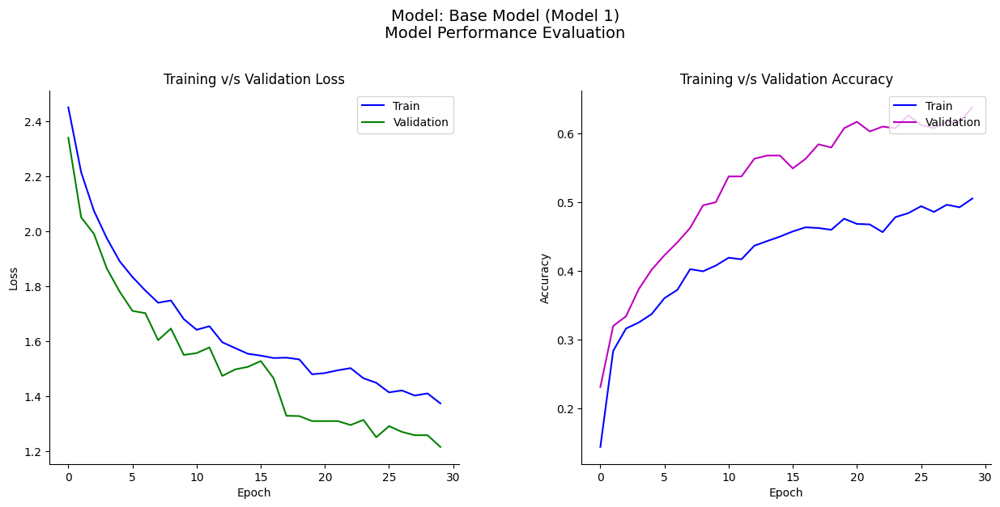

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_accuracy[model], val_accuracy[model] = [history[model].history['accuracy']], [history[model].history['val_accuracy']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model],val_loss[model]],             # Data for First Plot
                       [train_accuracy[model],val_accuracy[model]],     # Data for Second Plot
                   ],
                   (Loss_Matrics, Accuracy_Matrics),
                   title = f"Model: {model_name} ({model})\nModel Performance Evaluation".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Observation**

**Loss**:
- Both the training and validation loss decrease consistently over the epochs, which is a positive sign indicating that the model is learning.
- The gap between the training and validation loss is small and remains consistent, suggesting that the model is not overfitting significantly.
- The final training loss is slightly lower than the validation loss, which is typical, but the difference is not alarming. This implies that the model has generalized well to the validation data.

**Accuracy**:
- The training accuracy steadily increases over time, as does the validation accuracy. This is a good sign that the model is improving its predictions.
- The validation accuracy increases more rapidly than the training accuracy initially, which could indicate that the model is finding patterns in the data that generalize well.
- As the epochs progress, the growing disparity between validation and training accuracy suggests that the model is becoming increasingly overfit.

**Compare Performance of Train, Validation and Test Datasets**

In [ ]:
train_perf[model] = model_performance_classification_sklearn(models[model], X_train_normalized, y_train_encoded, classification_type = 'categorical', average='weighted')
val_perf[model] = model_performance_classification_sklearn(models[model], X_val_normalized, y_val_encoded, classification_type = 'categorical', average='weighted')
test_perf[model] = model_performance_classification_sklearn(models[model], X_test_normalized, y_test_encoded, classification_type = 'categorical', average='weighted')

# Add the 'Dataset' column to each DataFrame
train_perf[model]['Dataset'] = 'Train'
val_perf[model]['Dataset'] = 'Validation'
test_perf[model]['Dataset'] = 'Test'

# Concatenate the DataFrames
combined_perf = pd.concat([train_perf[model], val_perf[model], test_perf[model]], ignore_index=True)

# Reorder columns to have 'Dataset' as the first column
combined_perf = combined_perf[['Dataset', 'Accuracy', 'Recall', 'Precision', 'F1 Score']]

# Display the combined DataFrame
combined_perf

,Dataset,Accuracy,Recall,Precision,F1 Score
0,Train,0.694,0.694,0.666,0.644
1,Validation,0.638,0.638,0.589,0.579
2,Test,0.642,0.642,0.588,0.592


**Observation**

**Performance Analysis**
- **Training Data**: The model performs better on the training data compared to the validation and test datasets. This indicates that the model has learned the patterns in the training data well.
- **Validation Data**: There's a noticeable drop in performance from the training data to the validation data. This suggests that the model may be overfitting to the training data, meaning it's capturing details specific to the training set that don't generalize well to unseen data.
- **Test Data**: The performance on the test data is slightly lower than on the validation data. This further supports the possibility of overfitting, as the model's ability to generalize is not as strong as its ability to learn from the training data.

**Confusion Matrix**

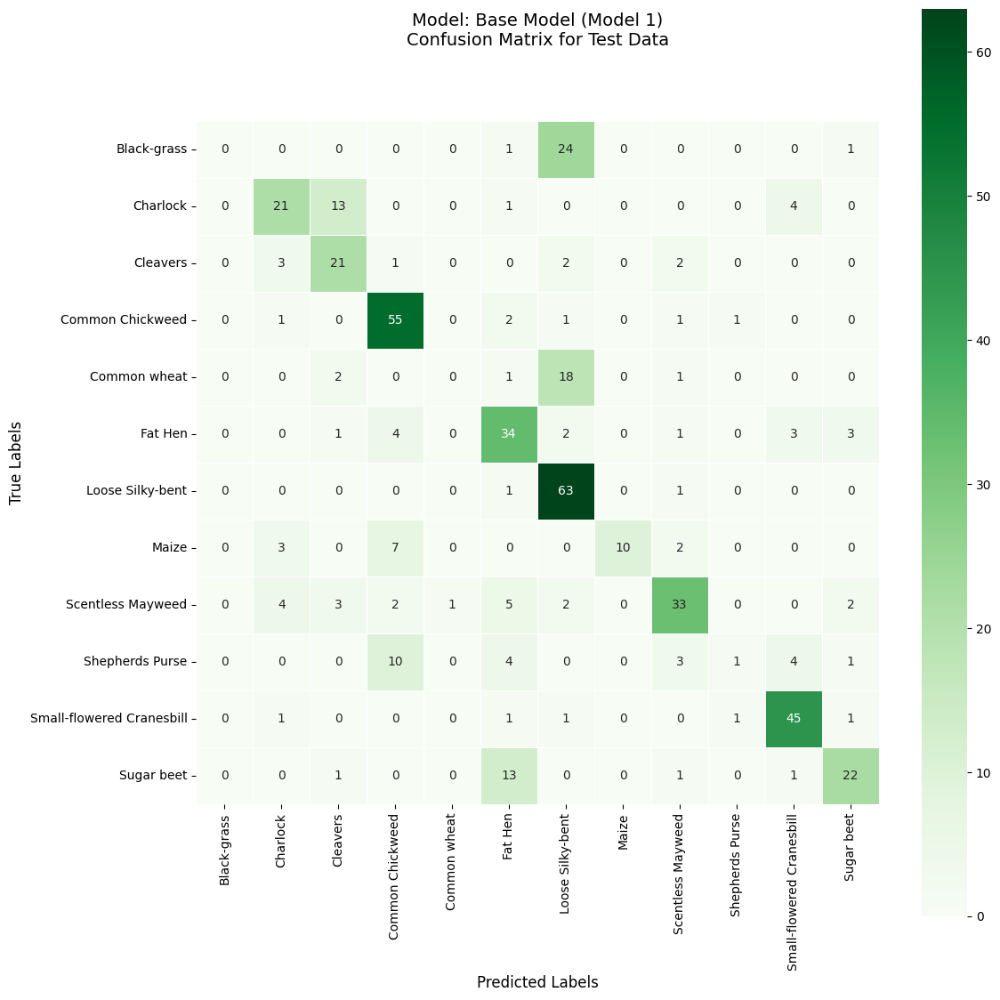

In [ ]:
# Determine the predictions for the test data
y_test_pred[model] = prediction(models[model], X_test_normalized, classification_type = 'categorical')

# Plot the confusion matrix for the test Data for the current Model
confusion_matrix_sklearn(np.argmax(y_test_encoded, axis = 1),
                         y_test_pred[model],
                         ticklabels = list(enc.classes_),
                         annot = True,
                         title = f"Model: {model_name} ({model})\nConfusion Matrix for Test Data".replace('_', ' '),
                         xtick_rotation = 90,
                         cmap = plt.cm.Greens,
                         )

**Observation**

The confusion matrix reveals valuable insights into the model's performance:

- **Correct Predictions**: Diagonal elements indicate correct predictions, with 'Loose Silky-bent', 'Common Chickweed', and ' Small-flowered Cranesbill' achieving the highest accuracy.
- **Misclassifications**: Off-diagonal elements highlight misclassifications, with 'Black-grass' and 'Common Wheat' showing zero correct predictions.
- **Class-specific Performance**:
 - 'Sugar Beet', 'Shepherd's Purse', 'Maize', 'Cleaver', 'Charlock' and 'Shepherds Purse' have no accurate predictions.
 - Notable misclassifications include 'Black-grass' and 'Common Wheat' being frequently predicted as 'Loose Silky-bent', 'Shepherds Purse' as 'SCommon Chickweed', and 'Sugar Beet' as 'Fat Hen'.

**Recommendations**

To improve the model's performance:
1. **Address Class Imbalance**: Implement data augmentation techniques to overcome the imbalance in training data, ensuring underrepresented classes receive adequate attention.
2. **Adjust Learning Rate**: Reduce the learning rate to potentially enhance overall prediction accuracy.
3. **Increase Epochs**: Boost training accuracy by increasing the number of epochs.

By addressing these recommendations, the model's performance can be significantly improved.


**Classification Report**

In [ ]:
from sklearn import metrics

classes = enc.classes_  # Get the class labels from the encoder

# Create a dictionary mapping from encoded indices to class labels
index_to_class = {i: cls for i, cls in enumerate(classes)}

report_dict = metrics.classification_report(np.argmax(y_test_encoded, axis = 1), y_test_pred[model], output_dict=True)

# Convert the modified report dictionary into a DataFrame
report = print_classification_report(pd.DataFrame(report_dict), index_to_class)

print(f"Classification Report of Model: {model_name}\n")
report

Classification Report of Model: Base Model



,precision,recall,f1-score,support
0 - Black-grass,0.000,0.000,0.000,26.000
1 - Charlock,0.636,0.538,0.583,39.000
2 - Cleavers,0.512,0.724,0.600,29.000
3 - Common Chickweed,0.696,0.902,0.786,61.000
4 - Common wheat,0.000,0.000,0.000,22.000
5 - Fat Hen,0.540,0.708,0.613,48.000
6 - Loose Silky-bent,0.558,0.969,0.708,65.000
7 - Maize,1.000,0.455,0.625,22.000
8 - Scentless Mayweed,0.733,0.635,0.680,52.000
9 - Shepherds Purse,0.333,0.043,0.077,23.000


**Observation**:
- **Performance Variability**: The model performs well on some classes (e.g., Small-flowered Cranesbill with high precision and recall) but poorly on others (e.g., Black-grass and Common wheat with zero F1 scores).

- **Class Imbalance**: The performance on classes with fewer instances (e.g., Maize and Shepherds Purse) shows a significant drop in recall, indicating possible issues with class imbalance or insufficient training data for these classes.

- **Accuracy vs. Average Metrics**: The overall accuracy is around 0.65, does not capture the model's performance variability across different classes. The macro and weighted averages provide more insight into how the model performs across all classes, considering their support.

- **Focus Areas**: Consider focusing on improving the classification of underperforming classes, especially those with low recall and precision, to enhance overall model performance.

## Model Performance Improvement

### **Reducing the Learning Rate**

**Hint**: Use **ReduceLRonPlateau()** function that will be used to decrease the learning rate by some factor, if the loss is not decreasing for some time. This may start decreasing the loss at a smaller learning rate. There is a possibility that the loss may still not decrease. This may lead to executing the learning rate reduction again in an attempt to achieve a lower loss.

In [ ]:
from keras.callbacks import ReduceLROnPlateau

# Define the ReduceLROnPlateau callback to adjust the learning rate during training and validation
# This technique helps improve the training process by reducing the learning rate when the model’s performance plateaus

learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy',
                                                patience = 3,
                                                verbose = 1,
                                                factor = 0.5,
                                                min_lr = 0.00001)



### **Data Augmentation**

Remember, **data augmentation should not be used in the validation/test data set**.

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator    # Importing the ImageDataGenerator for data augmentation

clear_session(random_index)                 # Clear the Keras session to reset the state

train_datagen = ImageDataGenerator(         # Initialize the ImageDataGenerator
                              rotation_range = 30,
                              shear_range = 0.20,
                              zoom_range = 0.20,
                              width_shift_range = 0.20,
                              height_shift_range = 0.20,
                              vertical_flip = True,
                              horizontal_flip = True,
                              fill_mode = 'nearest'
                              )

### **Early Stopping**

In [ ]:
# Callback for Early Stopping to Prevent Overfitting
callback_es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                               patience = 20,
                                               min_delta = 0.0001,
                                               restore_best_weights = True)

### Build the Model

**Convolution Model 2**: Build a model with the following hyperparameters to improve the performance:

- Convolutional Layers:
 - 3 with increasing filter sizes and 'He Normal' karnel Initilization
 - Each followed by a pooling layer, and Batch Normalization Layer to extract and downsample features at multiple scales.
 - Dropout Layer after 2nd and 3rd convolution layer
- Dense Layers: 1 layer including dropout layer
- Output Layer: 12 units
- Output Activation Function: Softmax (for multi-class classification)
- Activation Function for All Layers: ReLU
- Loss Function: Categorical Crossentropy (suitable for multi-class classification)
- Optimizer: Adam with learning rate 0.001
- Epochs: 120
- Batch Size: 32


In [ ]:
# Define hyperparameters
model_name = "Augmented Model"                                                      # Define the model name
model = "Model_2"                                                                   # Model Sequence

model_parameters[model] = (                                                         # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                               # Model Name
            "model": model,                                                         # Model Sequence
            "layers": (                                                             # Model Layers
                                                                                    # Initial Conv2D layer with 128 filters, ReLU activation, and same padding
                      {"Conv2D": {"filters": 32, "kernel_size": (3, 3), "activation": "relu", "padding": "same", "kernel_initializer": "he_normal", "input_shape": (64, 64, 3)}},
                      {"BatchNormalization": {}},                                   # BatchNormalization layer
                      {"MaxPooling2D": {"pool_size": (2, 2), "padding": "same"}},   # MaxPooling layer with pool size of 2x2 and same padding
                                                                                    # Conv2D layer with 64 filters, ReLU activation, and same padding
                      {"Conv2D": {"filters": 64, "kernel_size": (3, 3), "activation": "relu", "padding": "same", "kernel_initializer": "he_normal"}},
                      {"BatchNormalization": {}},                                   # BatchNormalization layer
                      {"MaxPooling2D": {"pool_size": (2, 2), "padding": "same"}},   # MaxPooling layer with pool size of 2x2 and same padding
                                                                                    # Conv2D layer with 32 filters, ReLU activation, and same padding
                      {"Conv2D": {"filters": 64, "kernel_size": (3, 3), "activation": "relu", "padding": "same", "kernel_initializer": "he_normal"}},
                      {"BatchNormalization": {}},                                   # BatchNormalization layer
                      {"MaxPooling2D": {"pool_size": (2, 2), "padding": "same"}},   # MaxPooling layer with pool size of 2x2 and same padding

                      {"Flatten": {}},                                              # Flatten layer

                      {"BatchNormalization": {}},                                   # BatchNormalization layer
                                                                                    # Dense layer with 16 units and ReLU activation
                      {"Dense": {"units": 512, "activation": "relu"}, "kernel_regularizer": "l2(0.01)"},
                      {"Dropout": {"rate": 0.3}},                                   # Dropout layer with a rate of 0.3

                      {"BatchNormalization": {}},                                   # BatchNormalization layer
                                                                                    # Dense layer with 16 units and ReLU activation
                      {"Dense": {"units": 128, "activation": "relu"}, "kernel_regularizer": "l2(0.01)"},
                      {"Dropout": {"rate": 0.3}},                                   # Dropout layer with a rate of 0.3

                      {"Dense": {"units": 12, "activation": "softmax"}},            # Output Dense layer with 12 units for classification and softmax activation
            ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.001),                           # Optimizer configuration with learning rate as 0.001
                "loss": categorical_crossentropy,                                   # Loss function
                "metrics" : ['accuracy'],                                           # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 120,                                                     # Number of training epochs
                "batch_size" : 32,                                                  # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for Augmented Model (Model_2):


Model: "Model_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 4096)                │          16,384 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       2,097,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          65,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,240,268 (8.55 MB)

 Trainable params: 2,230,732 (8.51 MB)

 Non-trainable params: 9,536 (37.25 KB)

Epoch: 120
Batch Size: 32
Optimizer: Adam
Loss function: categorical_crossentropy
Metrics: str



**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(train_datagen.flow(X_train_normalized, y_train_encoded,
                                                      batch_size = model_parameters[model]['fit']['batch_size'],
                                                      shuffle = False),
                                                      validation_data = (X_val_normalized, y_val_encoded),
                                                      epochs = model_parameters[model]['fit']['epochs'],
                                                      steps_per_epoch = X_train_normalized.shape[0] // model_parameters[model]['fit']['batch_size'],
                                                      callbacks = [learning_rate_reduction, callback_es],
                                                      verbose = 1,
                                                      )

duration = convert_seconds(time.time() - start)  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration)} \n")

Training initiated for Augmented Model (Model_2)...

Epoch 1/120
120/120 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.2794 - loss: 2.4106 - val_accuracy: 0.1379 - val_loss: 6.1255 - learning_rate: 0.0010
Epoch 2/120
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 576us/step - accuracy: 0.3750 - loss: 1.9985 - val_accuracy: 0.1379 - val_loss: 6.4592 - learning_rate: 0.0010
Epoch 3/120
120/120 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.4759 - loss: 1.5161 - val_accuracy: 0.1472 - val_loss: 5.2601 - learning_rate: 0.0010
Epoch 4/120
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - accuracy: 0.5625 - loss: 1.5353 - val_accuracy: 0.1472 - val_loss: 5.1471 - learning_rate: 0.0010
Epoch 5/120
120/120 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.5736 - loss: 1.2706 - val_accuracy: 0.1519 - val_loss: 8.5461 - learning_rate: 0.0010
Epoch 6/120
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 549us/step - accuracy: 0.5938 - loss: 1.1524 - val_accuracy: 0.1519 - val_loss: 8.5591 - learning_rate: 0.0010
Epoch 7/120
120/1

**Model Evaluation**

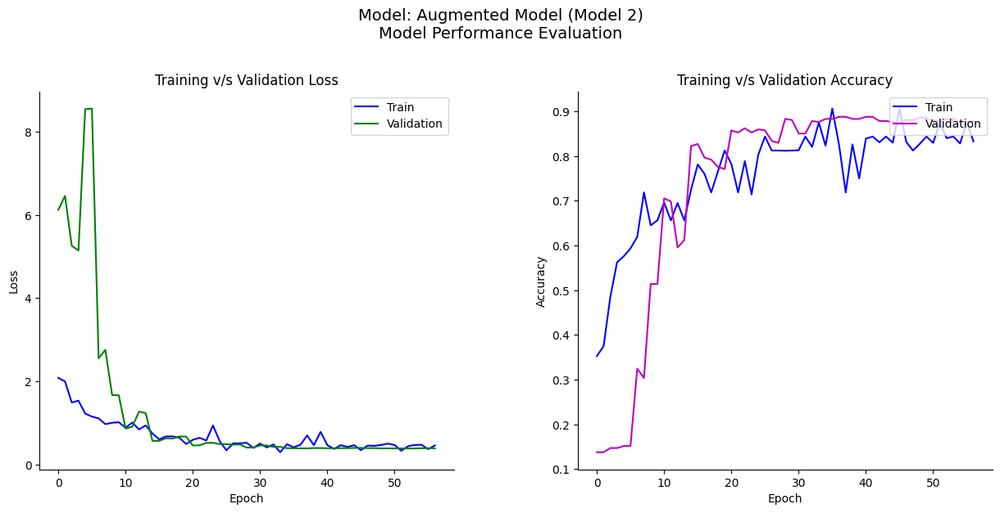

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_accuracy[model], val_accuracy[model] = [history[model].history['accuracy']], [history[model].history['val_accuracy']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model],val_loss[model]],
                       [train_accuracy[model],val_accuracy[model]],
                   ],
                   (Loss_Matrics, Accuracy_Matrics),
                   title = f"Model: {model_name} ({model})\nModel Performance Evaluation".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Observation**

**Observation**

**Loss**:
- The training and validation loss both show a significant decrease over the epochs, particularly in the early stages, indicating that the model is learning effectively.
- The training loss reaches a stable point with minimal fluctuations towards the end, suggesting that the model has effectively minimized the error on the training data.
- There is a noticeable gap between training and validation loss, especially in the initial epochs, but this gap narrows as training progresses. This might suggest some initial overfitting that reduces over time.
- The final validation loss is slightly higher than the training loss, which is typical but may indicate slight overfitting. However, the difference is not too large, suggesting the model has generalized fairly well.

**Accuracy**:
- Both training and validation accuracy show a consistent upward trend, with validation accuracy increasing more rapidly in the initial epochs.
- The training accuracy shows more fluctuations compared to validation accuracy. This might indicate that the model is still adjusting to the training data, while the validation accuracy suggests more stable performance.
- Validation accuracy plateaus towards the end, with both training and validation accuracy converging closely. This is a positive sign indicating that the model is not significantly overfitting and is able to generalize well to unseen data.
- The final accuracy values for training and validation are very close, which is a strong indication of good generalization by the model.

**Overall Conclusion**:
The model shows good learning behavior, with both loss and accuracy metrics suggesting effective training and generalization. There is some minor fluctuation in training accuracy, but the validation accuracy remains stable and converges well with the training accuracy, indicating that the model is well-tuned and not overfitting excessively.

**Compare Performance of Train, Validation and Test Datasets**

In [ ]:
train_perf[model] = model_performance_classification_sklearn(models[model], X_train_normalized, y_train_encoded, classification_type = 'categorical', average='weighted')
val_perf[model] = model_performance_classification_sklearn(models[model], X_val_normalized, y_val_encoded, classification_type = 'categorical', average='weighted')
test_perf[model] = model_performance_classification_sklearn(models[model], X_test_normalized, y_test_encoded, classification_type = 'categorical', average='weighted')

# Add the 'Dataset' column to each DataFrame
train_perf[model]['Dataset'] = 'Train'
val_perf[model]['Dataset'] = 'Validation'
test_perf[model]['Dataset'] = 'Test'

# Concatenate the DataFrames
combined_perf = pd.concat([train_perf[model], val_perf[model], test_perf[model]], ignore_index=True)

# Reorder columns to have 'Dataset' as the first column
combined_perf = combined_perf[['Dataset', 'Accuracy', 'Recall', 'Precision', 'F1 Score']]

# Display the combined DataFrame
combined_perf

,Dataset,Accuracy,Recall,Precision,F1 Score
0,Train,0.885,0.885,0.893,0.887
1,Validation,0.888,0.888,0.891,0.888
2,Test,0.848,0.848,0.860,0.851


**Observation**

**Performance Analysis**:

**Training Data**: The model performs exceptionally well on the training data, demonstrating a strong ability to learn and adapt to the patterns present in this dataset.

**Validation Data**: Performance on the validation data is very close to that on the training data, indicating that the model generalizes well to new data that it has not been trained on. This suggests that the model's learning is not overly specific to the training data.

**Test Data: The model's performance on the test data is slightly lower than on both the training and validation data. This drop in performance suggests that while the model generalizes well, there might still be some challenges in achieving the same level of accuracy and effectiveness on completely unseen data. However this variation is in acceptable ramge.

**Confusion Matrix**

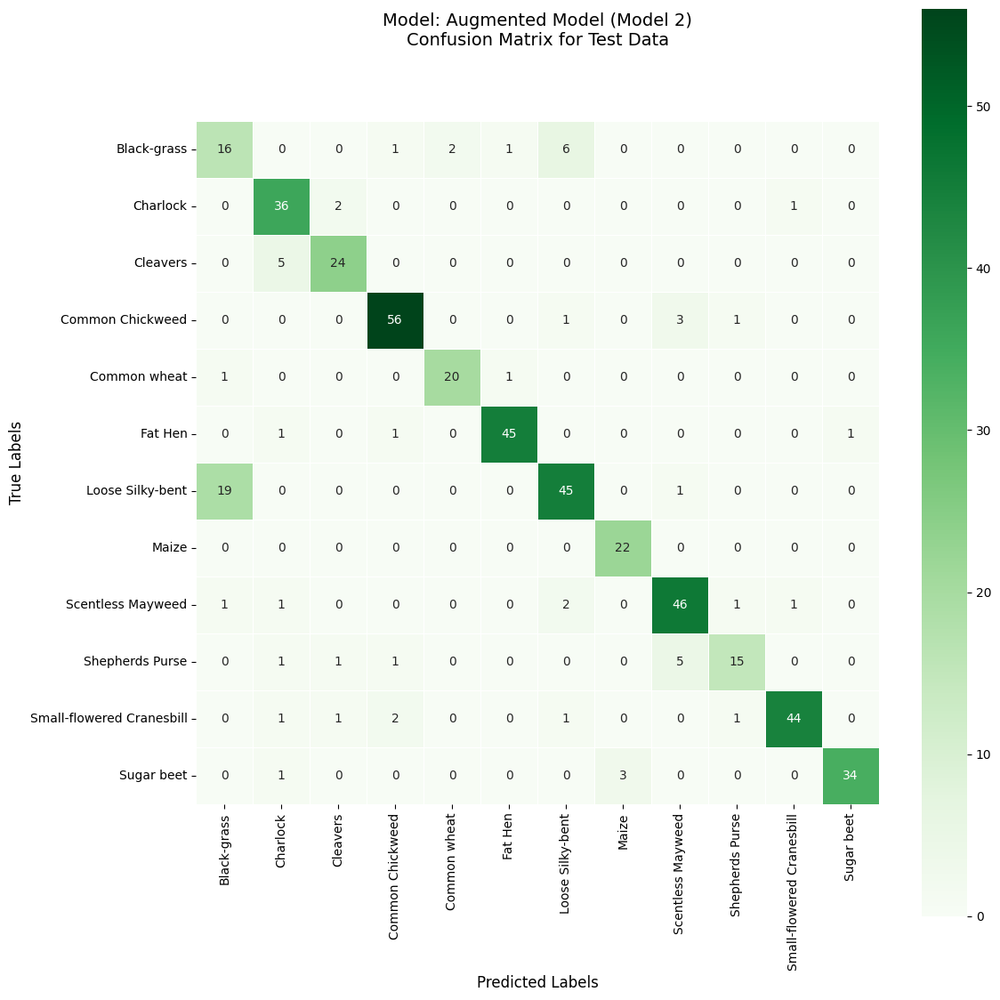

In [ ]:
# Determine the predictions for the test data
y_test_pred[model] = prediction(models[model], X_test_normalized, classification_type = 'categorical')

# Plot the confusion matrix for the test Data for the current Model
confusion_matrix_sklearn(np.argmax(y_test_encoded, axis = 1),
                         y_test_pred[model],
                         ticklabels = list(enc.classes_),
                         annot = True,
                         title = f"Model: {model_name} ({model})\nConfusion Matrix for Test Data".replace('_', ' '),
                         xtick_rotation = 90,
                         cmap = plt.cm.Greens,
                         )

**Observation**

The confusion matrix reveals valuable insights into the model's performance:

- **Correct Predictions**: The diagonal elements reveal correct predictions, showcasing an overall increase in accuracy across all classes.
- **Misclassifications**: Off-diagonal elements pinpoint misclassifications, allowing for targeted improvement.
- **Class-specific Performance**:
 - Most classes exhibit exceptionally high prediction accuracy.
 - Notably, 'Black-grass' is often misclassified as 'Loose Silky-bent', indicating room for refinement in distinguishing between these two classes.


**Classification Report**

In [ ]:
from sklearn import metrics

classes = enc.classes_  # Get the class labels from the encoder

# Create a dictionary mapping from encoded indices to class labels
index_to_class = {i: cls for i, cls in enumerate(classes)}

report_dict = metrics.classification_report(np.argmax(y_test_encoded, axis = 1), y_test_pred[model], output_dict=True)

# Convert the modified report dictionary into a DataFrame
report = print_classification_report(pd.DataFrame(report_dict), index_to_class)

print(f"Classification Report of Model: {model_name}\n")
report

Classification Report of Model: Augmented Model



,precision,recall,f1-score,support
0 - Black-grass,0.432,0.615,0.508,26.000
1 - Charlock,0.783,0.923,0.847,39.000
2 - Cleavers,0.857,0.828,0.842,29.000
3 - Common Chickweed,0.918,0.918,0.918,61.000
4 - Common wheat,0.909,0.909,0.909,22.000
5 - Fat Hen,0.957,0.938,0.947,48.000
6 - Loose Silky-bent,0.818,0.692,0.750,65.000
7 - Maize,0.880,1.000,0.936,22.000
8 - Scentless Mayweed,0.836,0.885,0.860,52.000
9 - Shepherds Purse,0.833,0.652,0.732,23.000


**Observation**

The model excels in classifying most categories, especially Fat Hen, Sugar Beet, and Small-flowered Cranesbill, with high precision, recall, and F1 scores. The overall accuracy and macro-averaged metrics reflect strong and consistent performance across various classes.

## Final Model

Comment on the final model you have selected and use the same in the below code to visualize the image.

The tuned CNN model (Model 2), which incorporates a reduced Learning Rate, Data Augmentation and Early Stopping techniques, has demonstrated superior performance compared to the base CNN model (Models 1). This tuned model achieves more accurate predictions, highlighting the effectiveness of these adjustments in enhancing the model's performance.

### Visualizing the prediction

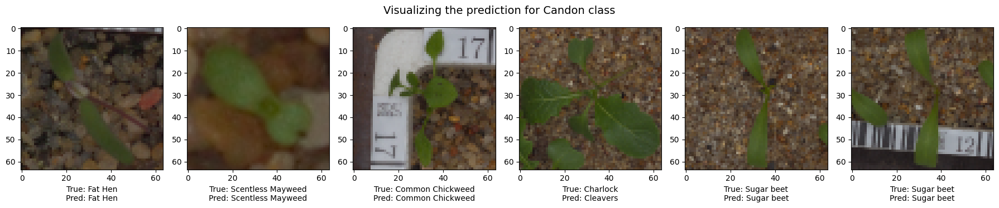

In [ ]:
num_images = 6                                # Number of images to display
fig = plt.figure(figsize=(3*num_images, 5))   # Set the figure size

indices = random.sample(range(len(X_test)), num_images)  # Randomly choose indices

for i, index in enumerate(indices):                               # Iterate over the chosen indices
    true_label = enc.inverse_transform(y_test_encoded)[index]     # Get the true label
                                                                  # Get the predicted label
    predicted_label = enc.inverse_transform(models[model].predict(X_test_normalized[index].reshape(1, 64, 64, 3), verbose = 0))[0]
    # PLot the Image
    plot_image(fig, X_test[index], (1, num_images, i + 1),
                xlabel = f"True: {true_label}\nPred: {predicted_label}",
                )

plt.suptitle("Visualizing the prediction for Candon class", y = 0.8,fontsize = 14)
                                                      # Set the title of the plot
plt.tight_layout()                                    # Adjust the spacing between subplots
plt.show()                                            # Show the figure

## Actionable Insights and Business Recommendations

1. **Enhanced Efficiency**: With about 93% accuracy, the model greatly reduces plant identification time and effort, freeing up human resources for other tasks.
2. **Room for Improvement**: Additional data could further refine the model, potentially improving accuracy even more.
3. **Eco-Friendly Integration**: Integrate the model with automatic weeding systems to target weeds over crops, reducing pesticide use and promoting sustainable farming.
4. **Mobile App for Farmers**: Develop a mobile app to help farmers quickly identify plants from photos, enabling faster decision-making.
5. **Precision Agriculture**: Use the model in precision agriculture to optimize resources like fertilization and irrigation, enhancing crop yield and reducing waste.
6. **Farm Management Systems**: Integrate with farm management software for better insights into plant health and growth, aiding in effective crop management.

_____